# **HW 1: Credit Card Churn Prediction**
<hr>

<u>**Members**</u><br>
Tharnarch Thoranisttakul 63340500025<br>
Athimet Aiewcharoen 63340500068
<hr>

## **Function and Import Necessary Libraries**

In [247]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings

from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix, classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

# ignore warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import RepeatedKFold, StratifiedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

from sklearn.model_selection import GridSearchCV

from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

In [248]:
def diagnostic_plots(df, variable:str):
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].plot.hist()

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)

    plt.show()  

In [249]:
def checkCorrFF(df):
    plt.figure(figsize=(20,10))
    cor = df.corr()
    # mask = np.zeros_like(cor, dtype=np.bool)
    # mask[np.triu_indices_from(mask)] = True
    sns.heatmap(cor, annot=True, cmap='inferno')
    plt.show()

In [250]:
def checkCorrFT(df, target):
    sns.pairplot(df, hue = target)

In [251]:
def checkOutput(df, col:str, colTarget:str, output:str):
    checkdf = df.loc[df[col] == colTarget]
    return checkdf[output].value_counts()

In [252]:
def IQRdrop(df, col:str):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    df = df.loc[(df[col] >= Q1 - 1.5*IQR) & (df[col] <= Q3 + 1.5*IQR)]
    return df

In [253]:
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

## **Data Exploration**

There are a total of 23 features in this dataset which are:

|Feature Name|Description|Data Type|
|-|-|-|
|<font color='green'>CLIENTNUM</font>|Unique identifier for the customer holding the account|
|<font color='green'>Attrition_Flag</font>|Internal event (customer activity) variable (Existing = 1, Attrited = 0)|<font color='red'>Categorical</font> [Output]|
|<font color='green'>Customer_Age</font>|Customer's Age in Years|<font color='red'>Numerical</font>|
|<font color='green'>Gender</font>|(M = Male, F = Female)|<font color='red'>Categorical</font>|
|<font color='green'>Dependent_Count</font>|Number of dependents|<font color='red'>Numerical</font>|
|<font color='green'>Education_Level</font>|Educational Qualification of the account holder (Uneducated, High School, College, Graduate, Post-Graduate, Doctorate, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Marital_Status</font>|(Married, Single, Divorced, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Income_Category</font>|Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, >$120K)|<font color='red'>Categorical</font>|
|<font color='green'>Card_Category</font>|Type of Card (Blue, Silver, Gold, Platinum)</font>|<font color='red'>Categorical</font>|
|<font color='green'>Months_on_book</font>|Period of relationship with bank|<font color='red'>Numerical</font>|
|<font color='green'>Total_Relationship_Count</font>|Total no. of products held by the customer|<font color='red'>Numerical</font>|
|<font color='green'>Months_Inactive_12_mon</font>|No. of months inactive in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Contacts_Count_12_mon</font>|No. of Contacts in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Credit_Limit</font>|Credit Limit on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Total_Revolving_Bal</font>|Total Revolving Balance on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Open_To_Buy</font>|Open to Buy Credit Line (Average of last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Amt_Chng_Q4_Q1</font>|Change in Transaction Amount (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Amt</font>|Total Transaction Amount (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Ct</font>|Total Transaction Count (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Ct_Chng_Q4_Q1</font>|Change in Transaction Count (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Utilization_Ratio</font>|Average Card Utilization Ratio|<font color='red'>Numerical</font>|
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||

### **Import Dataset**

In [254]:
dfOri = df = pd.read_csv('HWdata/credit_card_churn.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [255]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [256]:
df.shape

(10127, 23)

We can see that this dataset has 23 features and 10127 data.

In [257]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [258]:
df.dtypes

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

### **Drop Unnecessary Features**

Since '<font color='orange'>CLIENTNUM</font>' is a unique classifier for each customer, we will drop this feature.
The last 2 features, '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1</font>' and '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2</font>', are for Naive Bayes Classifier, which we won't be using in this assignment, we will also drop these features.


In [259]:
df.drop(
['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], 
axis=1, inplace=True)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [260]:
df.shape

(10127, 20)

In [261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

After dropping the unnecessary features, we are left with 20 features.

In which, there are:

- 6 features that are '<font color='green'>object</font>', which means that they are '<font color='red'>Categorical Features</font>'.
- 14 features that are '<font color='green'>int64</font>' and '<font color='green'>float64</font>', which means that they are '<font color='red'>Numerical Features</font>'

### **Sort Features**
**Order:**
1. Numerical Features
2. Categorical Features
3. Output

**Separate Numerical Features from Dataset**

In [262]:
dfNum = df.select_dtypes(include=['int64', 'float64'])

**Separate Categorical Features from Dataset**

In [263]:
dfCate = df.select_dtypes(include=['object'])
dfCate = dfCate.iloc[:,1:]

**Separate Output from Dataset**

In [264]:
dfOut = df.iloc[:,0:1]

**Concatenate Separated Data**

In [265]:
df = pd.concat([dfNum, dfCate, dfOut], axis=1)
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer' : 1,'Attrited Customer': 0})
df

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,M,Graduate,Single,$40K - $60K,Blue,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


### **Model Training w/o Data Preprocessing**

In [266]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

#get the dummy variables for the categorical variables
dfbm = pd.get_dummies(df)

xbm = dfbm.drop(['Attrition_Flag'], axis = 1)
ybm = dfbm['Attrition_Flag']

xbm_train,xbm_test,ybm_train,ybm_test = train_test_split(xbm,ybm,test_size = 0.2,random_state = 0)

clfbm = LogisticRegression()
clfbm.fit(xbm_train,ybm_train)
print("model score: %.8f" % clfbm.score(xbm_test, ybm_test))

model score: 0.89338598


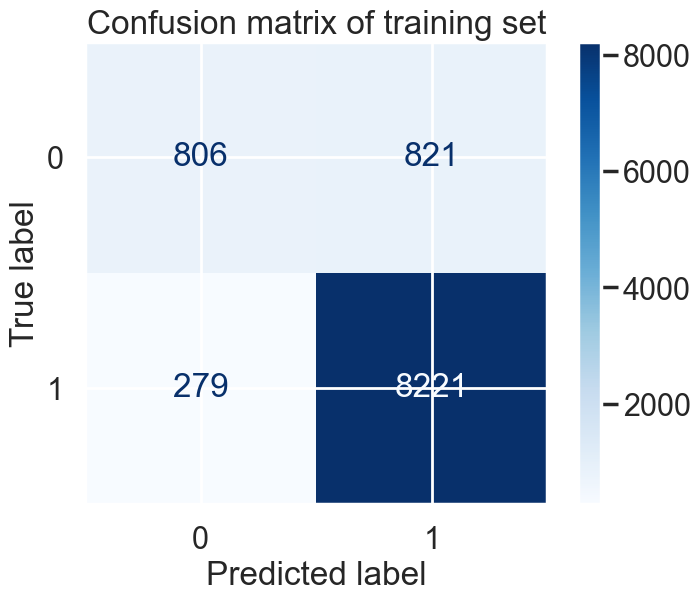

In [267]:
# Plot confusion matrix of training set
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clfbm,
                      xbm,
                      ybm,
                      display_labels=list(set(ybm_test)),
                      cmap=plt.cm.Blues) 
plt.title('Confusion matrix of training set')
plt.show()  

In [268]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_train = clfbm.predict(xbm_train)
print("Classification report on Train data\n=======================")
print(classification_report(y_true=ybm_train, y_pred=ybm_pred_train))
print("Confusion matrix on Train data\n=======================")

print(confusion_matrix(y_true=ybm_train, y_pred=ybm_pred_train))

Classification report on Train data
              precision    recall  f1-score   support

           0       0.75      0.50      0.60      1318
           1       0.91      0.97      0.94      6783

    accuracy                           0.89      8101
   macro avg       0.83      0.73      0.77      8101
weighted avg       0.88      0.89      0.88      8101

Confusion matrix on Train data
[[ 654  664]
 [ 220 6563]]


In [269]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_test = clfbm.predict(xbm_test)
print("Classification report on Test data\n=======================")
print(classification_report(y_true=ybm_test, y_pred=ybm_pred_test))
print("Confusion matrix on Test data\n=======================")

print(confusion_matrix(y_true=ybm_test, y_pred=ybm_pred_test))

Classification report on Test data
              precision    recall  f1-score   support

           0       0.72      0.49      0.58       309
           1       0.91      0.97      0.94      1717

    accuracy                           0.89      2026
   macro avg       0.82      0.73      0.76      2026
weighted avg       0.88      0.89      0.88      2026

Confusion matrix on Test data
[[ 152  157]
 [  59 1658]]


### **Check Values of Numerical Features**

In [270]:
df.isnull().sum()

Customer_Age                0
Dependent_count             0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Gender                      0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Attrition_Flag              0
dtype: int64

In [271]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


<AxesSubplot:xlabel='Avg_Utilization_Ratio', ylabel='Count'>

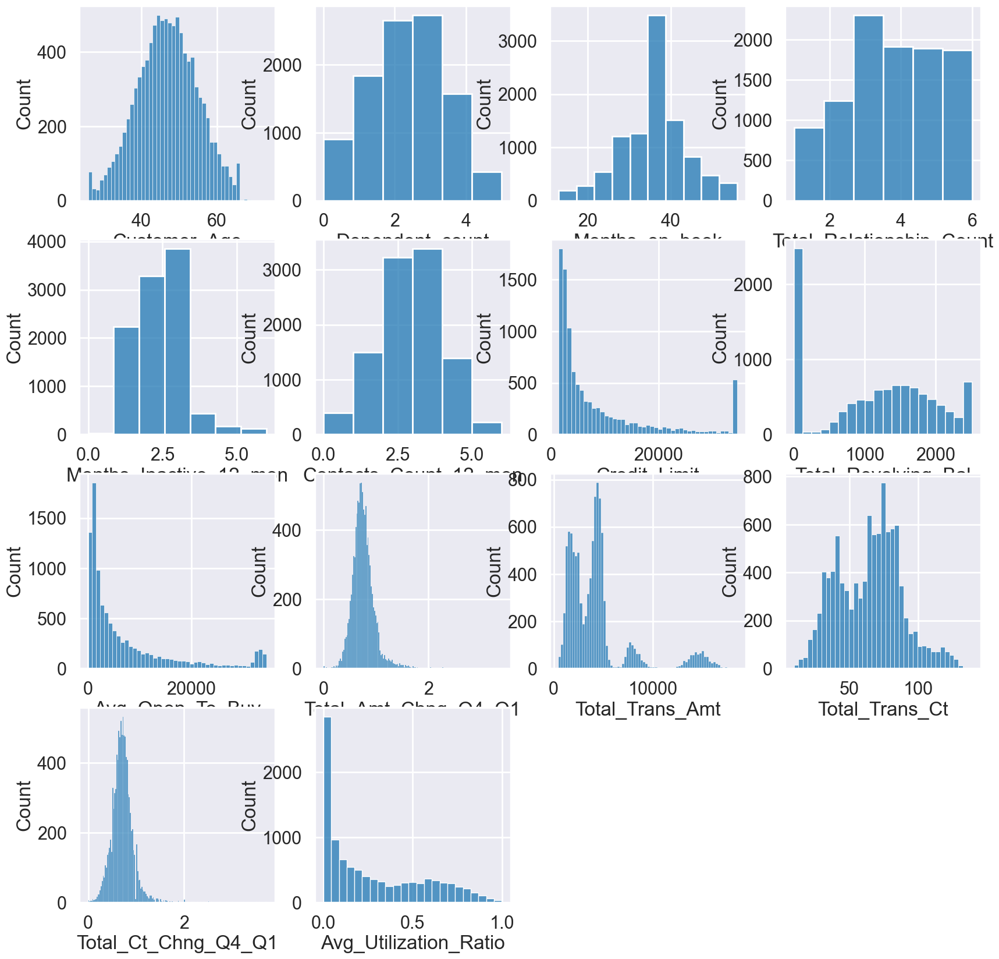

In [272]:
# plot numerical data
plt.figure(figsize=(20,20))
plt.subplot(441) 
sns.histplot(df['Customer_Age'])
plt.subplot(442) 
sns.histplot(df['Dependent_count'],bins=6)
plt.subplot(443) 
sns.histplot(df['Months_on_book'],bins=10)
plt.subplot(444) 
sns.histplot(df['Total_Relationship_Count'],bins=6)
plt.subplot(445) 
sns.histplot(df['Months_Inactive_12_mon'],bins=7)
plt.subplot(446) 
sns.histplot(df['Contacts_Count_12_mon'],bins=6)
plt.subplot(447) 
sns.histplot(df['Credit_Limit'])
plt.subplot(448) 
sns.histplot(df['Total_Revolving_Bal'])
plt.subplot(449) 
sns.histplot(df['Avg_Open_To_Buy'])
plt.subplot(4,4,10) 
sns.histplot(df['Total_Amt_Chng_Q4_Q1'])
plt.subplot(4,4,11)
sns.histplot(df['Total_Trans_Amt'])
plt.subplot(4,4,12)
sns.histplot(df['Total_Trans_Ct'])
plt.subplot(4,4,13)
sns.histplot(df['Total_Ct_Chng_Q4_Q1'])
plt.subplot(4,4,14)
sns.histplot(df['Avg_Utilization_Ratio'])

What we got from plotting values of numerical features:

|Feature Names|Normally Distributed|
|-|-|
|Customer_Age|Yes|
|Dependent_Count|Yes|
|Months_on_book|Yes|
|Total_Relationship_Count|No|
|Months_Inactive_12_mon|Almost|
|Contacts_Count_12_mon|Yes|
|Credit_Limit|No|
|Total_Revolving_Bal|No|
|Avg_Open_To_Buy|No|
|Total_Amt_Chng_Q4_Q1|Almost|
|Total_Trans_Amt|No|
|Total_Trans_Ct|Almost|
|Total_Ct_Chng_Q4_Q1|Almost|
|Avg_Utilization_Ratio|No|

### **Check Values of Categorical Features**

In [273]:
df['Gender'].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [274]:
# Calculate Percentage of Gender
100*df['Gender'].value_counts()/len(df)

F    52.908068
M    47.091932
Name: Gender, dtype: float64

In [275]:
df['Education_Level'].value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [276]:
# Calculate Percentage of Education Level
100*df['Education_Level'].value_counts()/len(df)

Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: Education_Level, dtype: float64

In [277]:
df['Marital_Status'].value_counts()

Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64

In [278]:
# Calculate Percentage of Marital Status
100*df['Marital_Status'].value_counts()/len(df)

Married     46.282216
Single      38.935519
Unknown      7.396070
Divorced     7.386195
Name: Marital_Status, dtype: float64

In [279]:
df['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [280]:
# Calculate Percentage of Income Category
100*df['Income_Category'].value_counts()/len(df)

Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
Unknown           10.980547
$120K +            7.178829
Name: Income_Category, dtype: float64

In [281]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [282]:
# Calculate Percentage of Card Category
100*df['Card_Category'].value_counts()/len(df)

Blue        93.176656
Silver       5.480399
Gold         1.145453
Platinum     0.197492
Name: Card_Category, dtype: float64

<AxesSubplot:title={'center':'Card Category'}>

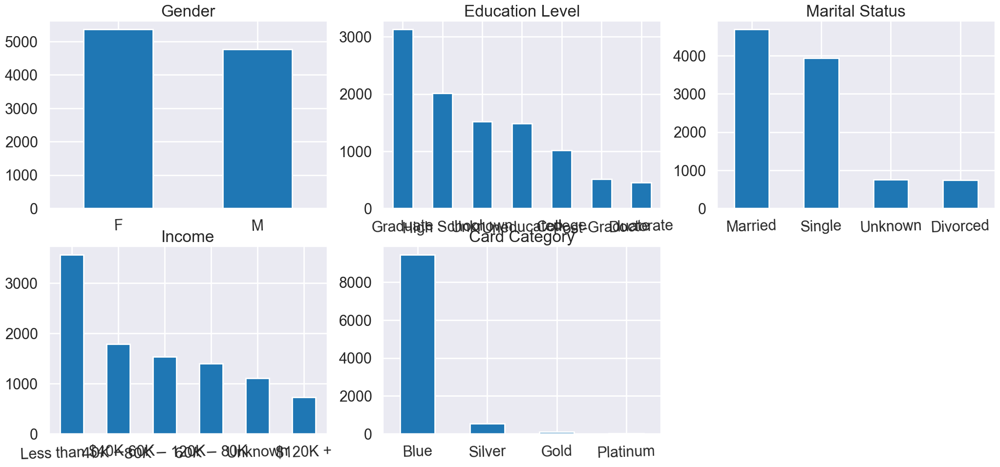

In [283]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
df['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
df['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
df['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
df['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
df['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

What we got from plotting values of categorical features:

|Feature Names|What we got|
|-|-|
|Gender|There are nearly the same amount of male and female.|
|Education_Level|Most of the people in this dataset are 'Graduate' and around 15% of the people are 'Unknown'|
|Marital_Status|46% of this data are 'Married', 39% are 'Single' and the rest are 'Unknown' or 'Divorced'|
|Income_Category|Most people in this dataset have 'less than 40K' income|
|Card_Category|People in this dataset mostly hold blue cards (more than 93%) and the rest hold the other 3 cards (less than 7%).|

### **Check Behaviour of Attrition_Flag**

In [284]:
dfAtt = df[df['Attrition_Flag'] == 0]
dfAtt

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
21,62,0,49,2,3,3,1438.3,0,1438.3,1.047,692,16,0.600,0.000,F,Graduate,Married,Less than $40K,Blue,0
39,66,0,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077,F,Doctorate,Married,Unknown,Blue,0
51,54,1,40,2,3,1,1438.3,808,630.3,0.997,705,19,0.900,0.562,F,Graduate,Married,Less than $40K,Blue,0
54,56,2,36,1,3,3,15769.0,0,15769.0,1.041,602,15,0.364,0.000,M,Graduate,Married,$120K +,Blue,0
61,48,2,35,2,4,4,34516.0,0,34516.0,0.763,691,15,0.500,0.000,M,Graduate,Married,$60K - $80K,Silver,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10119,55,3,47,4,3,3,14657.0,2517,12140.0,0.166,6009,53,0.514,0.172,F,Uneducated,Single,Unknown,Blue,0
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


In [285]:
dfExist = df[df['Attrition_Flag'] == 1]
dfExist

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10116,46,5,36,1,2,3,13187.0,2241,10946.0,0.689,15354,112,0.931,0.170,M,College,Single,$80K - $120K,Blue,1
10117,57,2,40,6,3,4,17925.0,1909,16016.0,0.712,17498,111,0.820,0.106,M,Graduate,Married,$80K - $120K,Blue,1
10120,54,1,34,5,2,0,13940.0,2109,11831.0,0.660,15577,114,0.754,0.151,M,High School,Single,$60K - $80K,Blue,1
10121,56,1,50,4,1,4,3688.0,606,3082.0,0.570,14596,120,0.791,0.164,F,Graduate,Single,Less than $40K,Blue,1


### **Plot Features of Attrited Customers**

<AxesSubplot:title={'center':'Card Category'}>

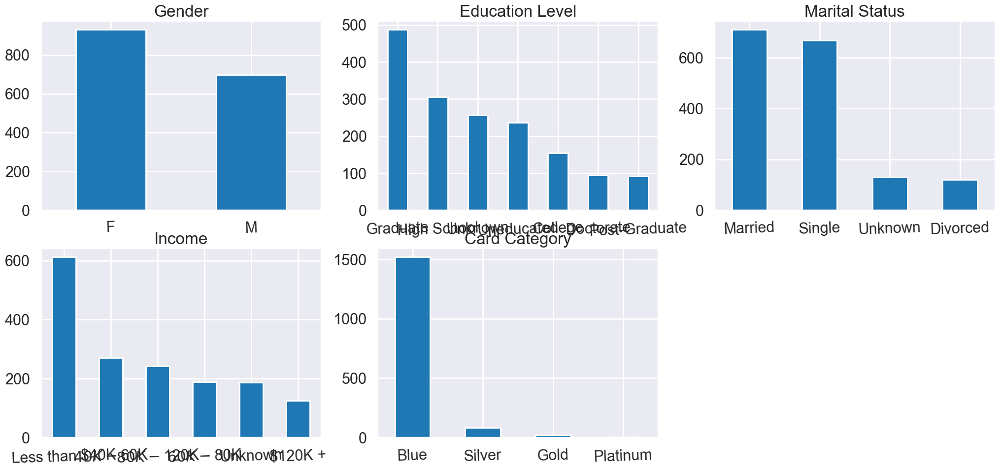

In [286]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfAtt['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfAtt['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfAtt['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfAtt['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfAtt['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

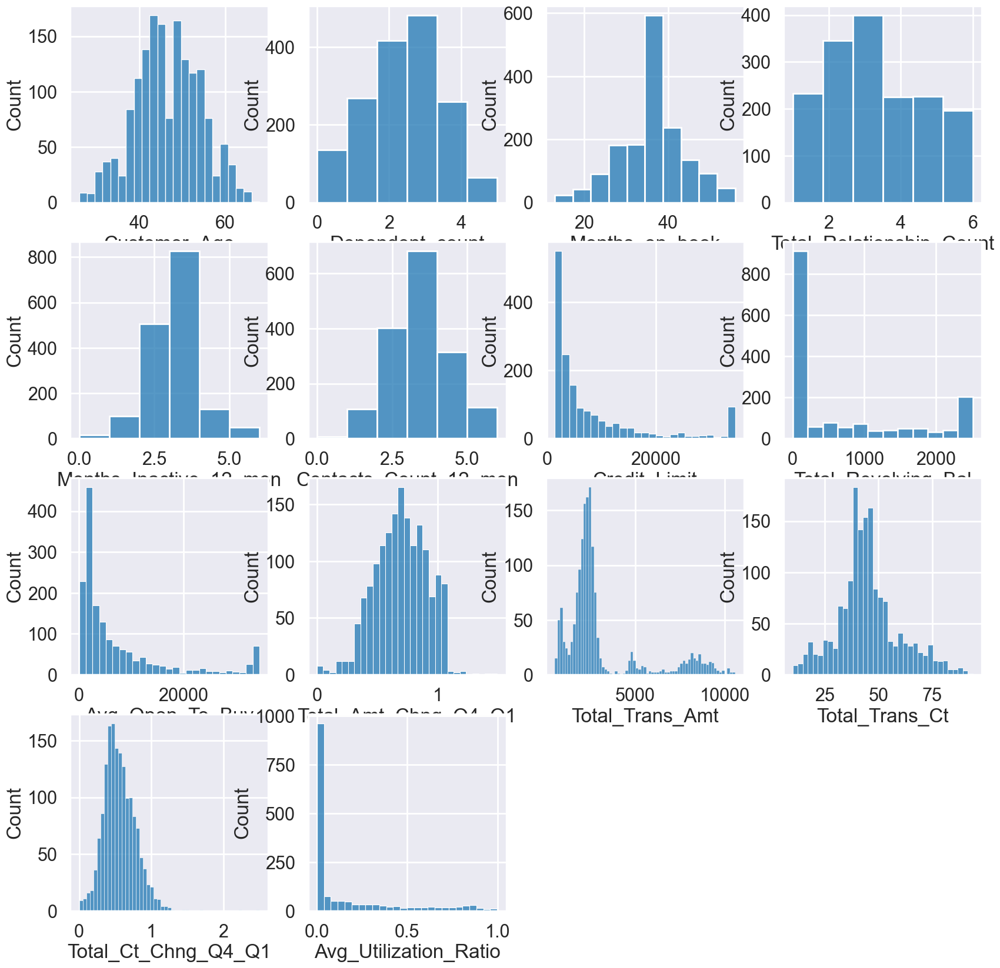

In [287]:
# plot numerical data
plt.figure(figsize=(20,20))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfAtt[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfAtt[col],bins=10)
        else:
            sns.histplot(dfAtt[col])

### **Plot Features of Existing Customers**

<AxesSubplot:title={'center':'Card Category'}>

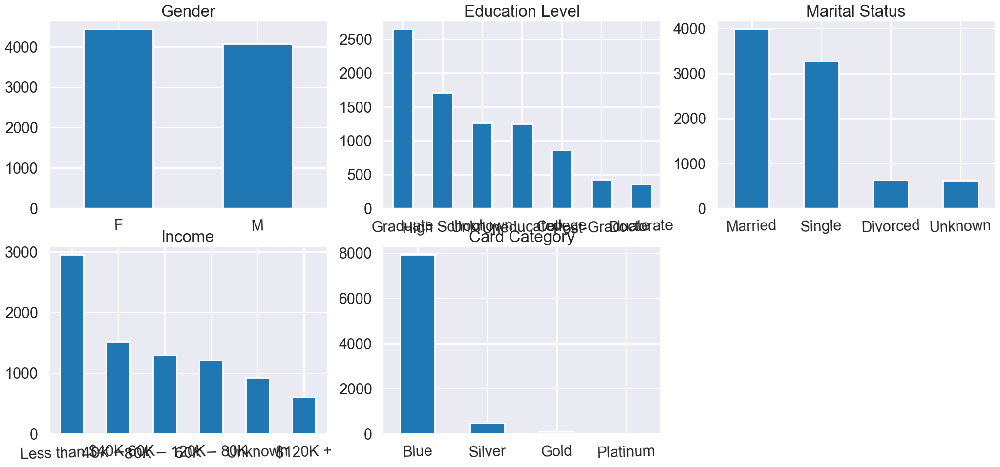

In [288]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfExist['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfExist['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfExist['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfExist['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfExist['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

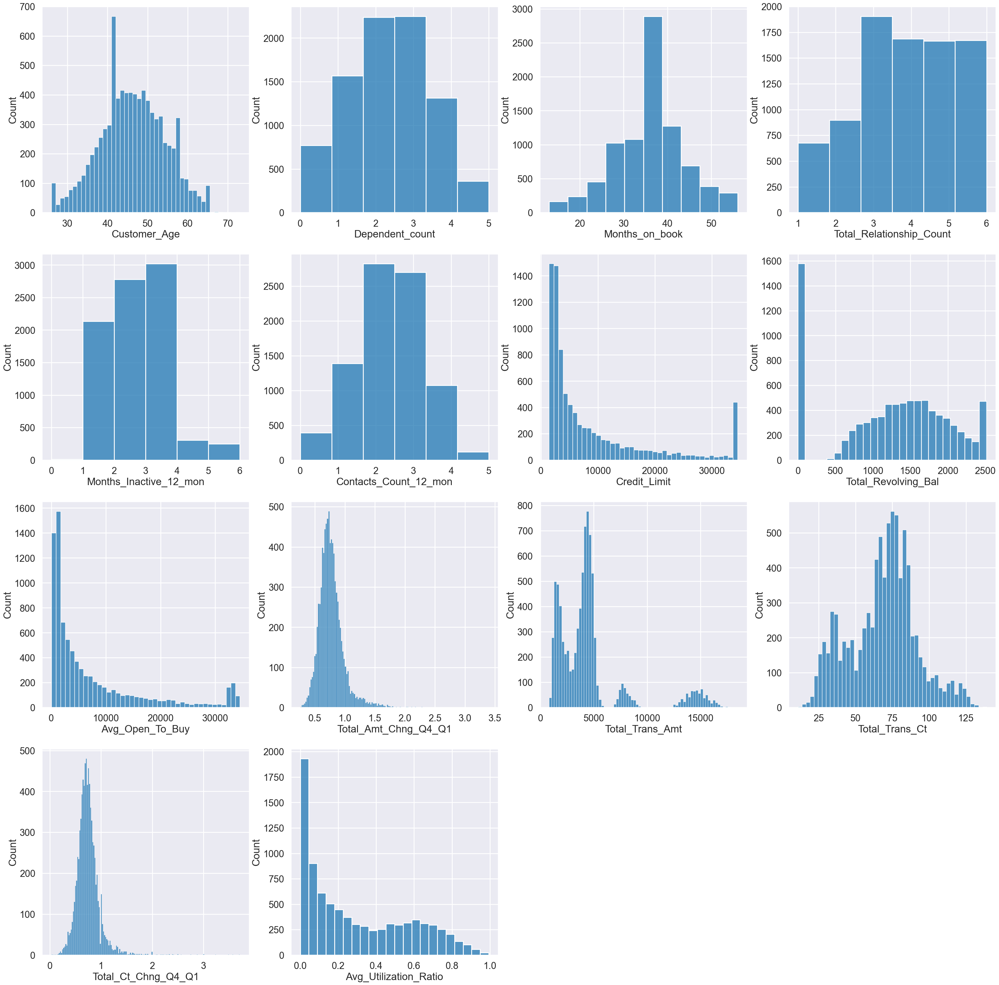

In [289]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfExist[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfExist[col],bins=10)
        else:
            sns.histplot(dfExist[col])

### **Pairplot Interesting Features**

In [290]:
# sns.pairplot(df[['Attrition_Flag','Total_Relationship_Count', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1','Avg_Utilization_Ratio']], diag_kind="hist", hue="Attrition_Flag")

Good and Bad things of this dataset:

|Good Things|Explanation|
|-|-|
|Data Distribution|Most Numerical data are normally distributed.|
|Filled Data in Numerical Features|There are no missing data (NaN) or unknown in numerical features of this dataset.|

<hr>

|Bad Things|Explanation|
|-|-|
|Data Explanation|Most features come with little to no explanation or bad explanation, eg. Avg_Open_To_Buy.|
|'Card_Category' Features|This feature's data are mostly 'Blue' (around 93%).|
|Unknown Data|Unclear explanation of what unknown data means and there are a lot of them in categorical features.|
|Data Variation|As we can see when pairplotting, variance between features are quite low and variance within class are quite high, which means that data variation is very bad.|

**NOTE**: For all 'Unknown' data in categorical features, we assumed 'Unknown' as a type of data because there are quite a lot of 'Unknown' data.

Furthermore, because we are dealing with a credit card dataset, which can be considered as a dataset provided by a bank, those 'Unknown' data might be undisclosed information of the customers.

### **Check Correlation between Numerical Features**

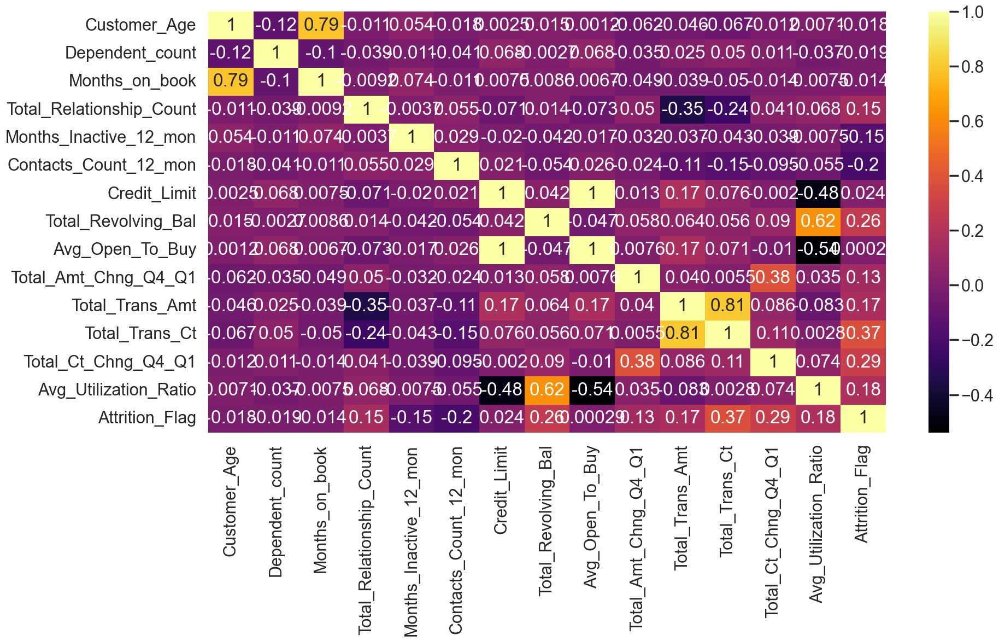

In [291]:
checkCorrFF(df)

From the heatmap above, we can drop these features:

|Feature Names|Reasons|
|-|-|
|Customer_Age|Looking at the heatmap, it correlates with 'Months_on_Book' (79%). We assumed that 'Months_on_Book' is more useful than 'Customer_Age'.|
|Credit_Limit|Looking at the heatmap, 'Credit_Limit' and 'Avg_Open_To_Buy' perfectly correlate to each other.|
|Total_Trans_Amt|Looking at the heatmap, it correlates with 'Total_Trans_Ct' (81%) and correlates with other features quite a lot.|
|Total_Amt_Chng_Q4_Q1|Looking at the heatmap, it correlates with 'Total_Ct_Chng_Q4_Q1' (38%).|
|Avg_Utilization_Ratio|Looking at the heatmap, it correlates too much with 3 features, 'Credit_Limit', 'Total_Revolving_Bal' and 'Avg_Open_To_Buy'.|

# **Resampling Method 1** : SMOTE (Synthetic Minority Oversampling TEchnique)
<hr>

## **Data Preprocessing**
### **Label Encoding**

<AxesSubplot:ylabel='Type'>

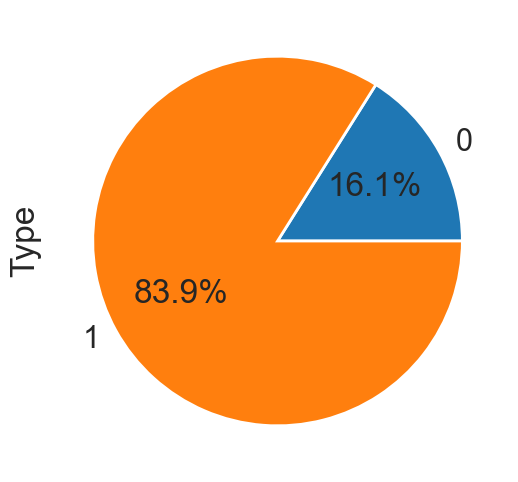

In [292]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.rcParams["figure.figsize"] = [8,6]

df.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [293]:
df_LE = df.copy()
le_Gender = LabelEncoder()
le_Education_Level = LabelEncoder()
le_Marital_Status = LabelEncoder()
le_Income_Category = LabelEncoder()
le_Card_Category = LabelEncoder()

df_LE['Gender'] = le_Gender.fit_transform(df_LE['Gender'])
df_LE['Education_Level'] = le_Gender.fit_transform(df_LE['Education_Level'])
df_LE['Marital_Status'] = le_Gender.fit_transform(df_LE['Marital_Status'])
df_LE['Income_Category'] = le_Gender.fit_transform(df_LE['Income_Category'])
df_LE['Card_Category'] = le_Gender.fit_transform(df_LE['Card_Category'])
df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,3,1,2,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,2,2,4,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1,2,1,3,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,3,3,4,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1,5,1,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,1,2,2,1,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1,6,0,1,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0,3,1,4,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,1,2,3,1,0,0


### **Resampling**

In [294]:
X = df_LE.drop(['Attrition_Flag'], axis=1)
y = df_LE['Attrition_Flag']

su = SMOTE(random_state=42)
X_su, y_su = su.fit_resample(X, y)
df_upsampled = pd.concat([X_su, y_su], axis=1)

1    8500
0    8500
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

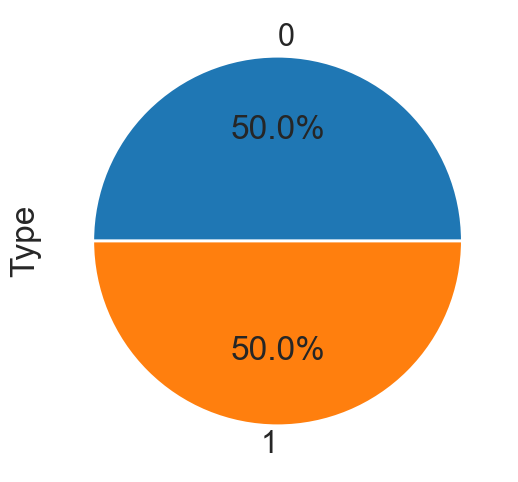

In [295]:
print(df_upsampled["Attrition_Flag"].value_counts())

df_upsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [296]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,46.271294,2.220765,35.856235,3.452824,2.360294,2.525353,8402.713796,952.554471,7450.075459,0.731899,3871.525882,56.681529,0.648346,0.229053,0.378471,2.945294,1.348294,2.749824,0.159471,0.500000
std,7.338467,1.211560,7.371276,1.506660,0.910366,1.029624,9093.883157,885.483077,9102.023938,0.210232,3063.080767,22.415308,0.233667,0.277267,0.485020,1.713820,0.703991,1.436521,0.624644,0.500015
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,2.000000,2.000000,2.000000,2395.000000,0.000000,1438.300000,0.604654,2021.000000,40.000000,0.498746,0.000000,0.000000,2.000000,1.000000,2.000000,0.000000,0.000000
50%,46.000000,2.000000,36.000000,3.000000,2.000000,3.000000,4332.580047,928.000000,3453.444526,0.721676,2657.000000,51.000000,0.639000,0.094011,0.000000,3.000000,1.000000,3.000000,0.000000,0.500000
75%,51.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10410.250000,1686.250000,9549.893091,0.847534,4578.000000,73.000000,0.775369,0.417694,1.000000,4.000000,2.000000,4.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000,6.000000,3.000000,5.000000,3.000000,1.000000


In [297]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Data Transformation**

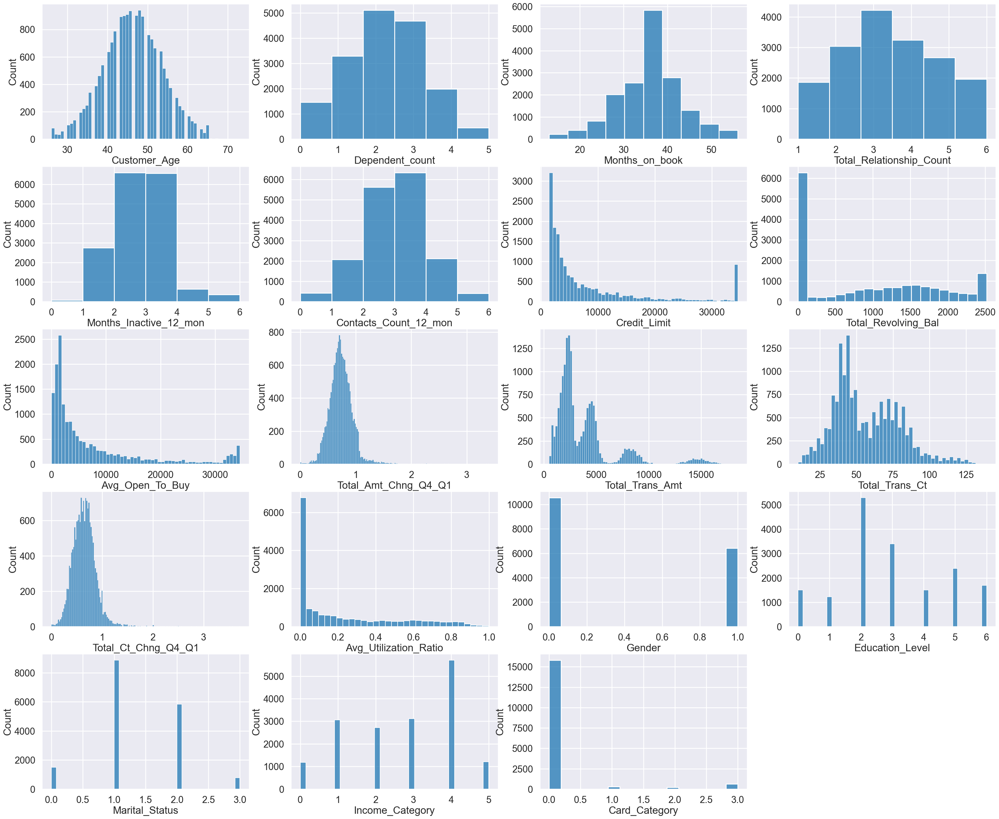

In [298]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

In [300]:
df_upsampled.columns
dfcopy = df_upsampled.copy()

In [316]:
df_upsampled = dfcopy.copy()

In [317]:
log_var = ['Credit_Limit','Total_Revolving_Bal','Avg_Open_To_Buy',
           'Total_Trans_Amt','Avg_Utilization_Ratio']

for idx,col in enumerate(df_upsampled.columns):
    df_upsampled[col] = np.log10(df_upsampled[col]/np.mean(df_upsampled[col])+1)

In [245]:
# df_upsampled['Avg_Open_To_Buy']=np.cbrt(df_upsampled['Avg_Open_To_Buy'])

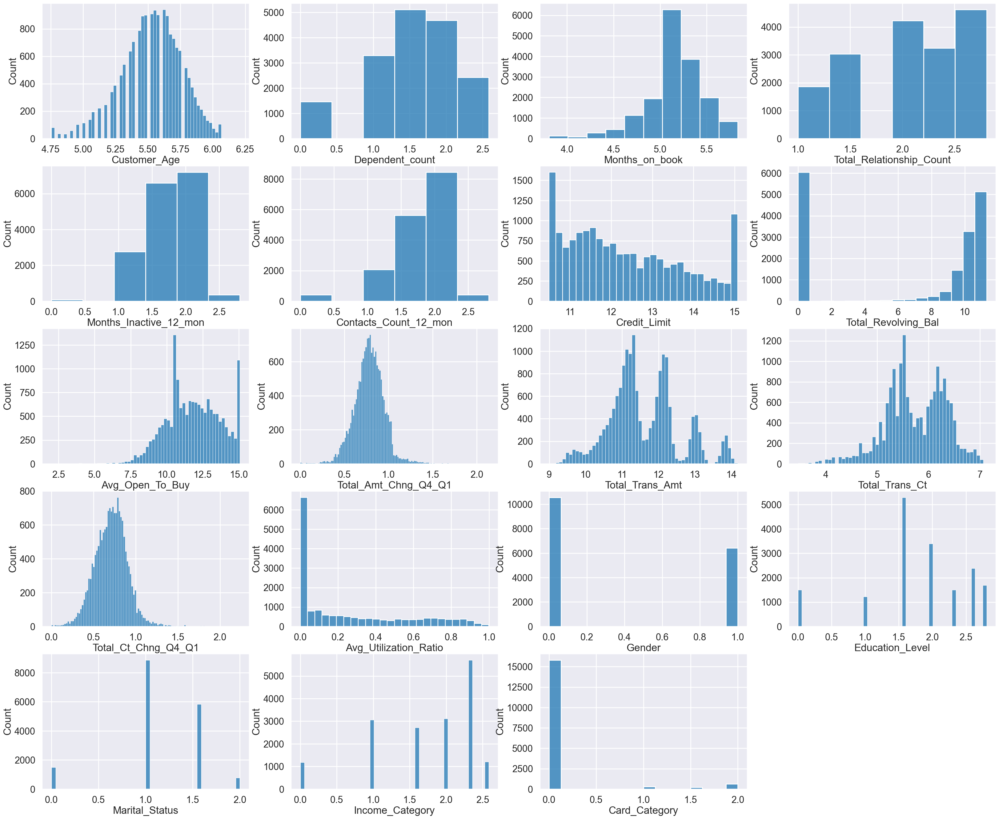

In [318]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

### **Clear outlier**

#### **Strip Plot**

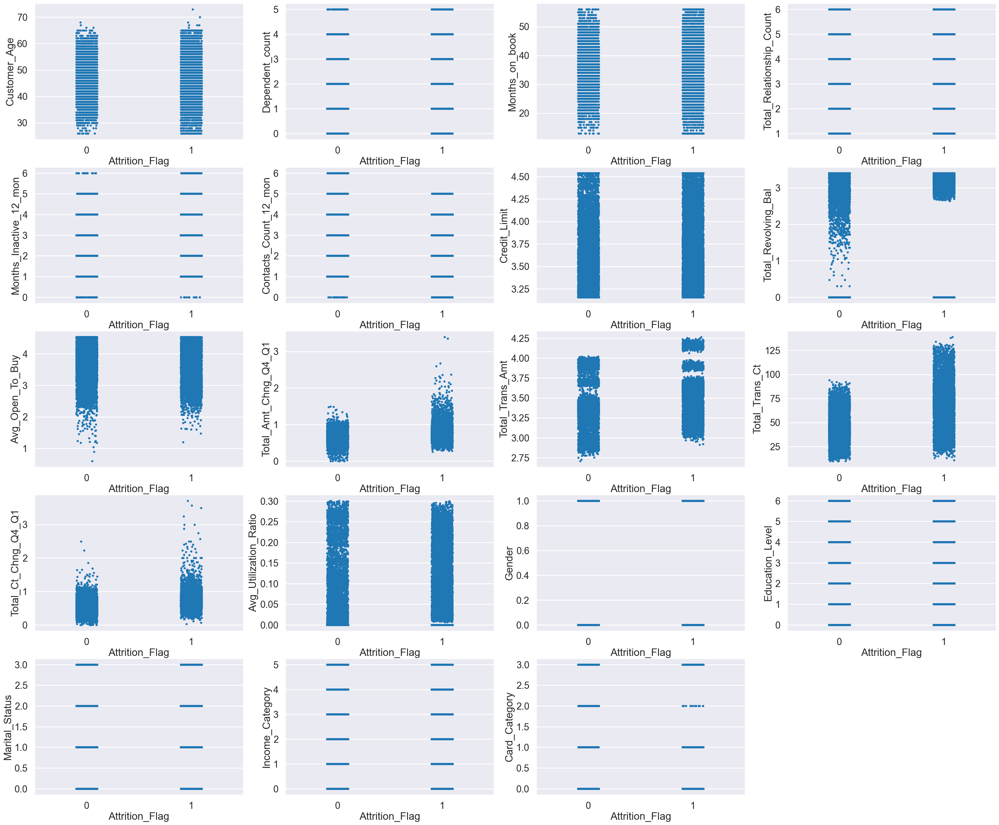

In [188]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

#### **Remove Outliers**

In [116]:
df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 1.25].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 1.75].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print(df_upsampled.shape)

df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Ct'] >= 130].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print(df_upsampled.shape)

df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 1.25].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 1.75].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print(df_upsampled.shape)

df_upsampled = IQRdrop(df_upsampled, 'Customer_Age')
print(df_upsampled.shape)

(16866, 20)
(16866, 20)
(16866, 20)
(16866, 20)


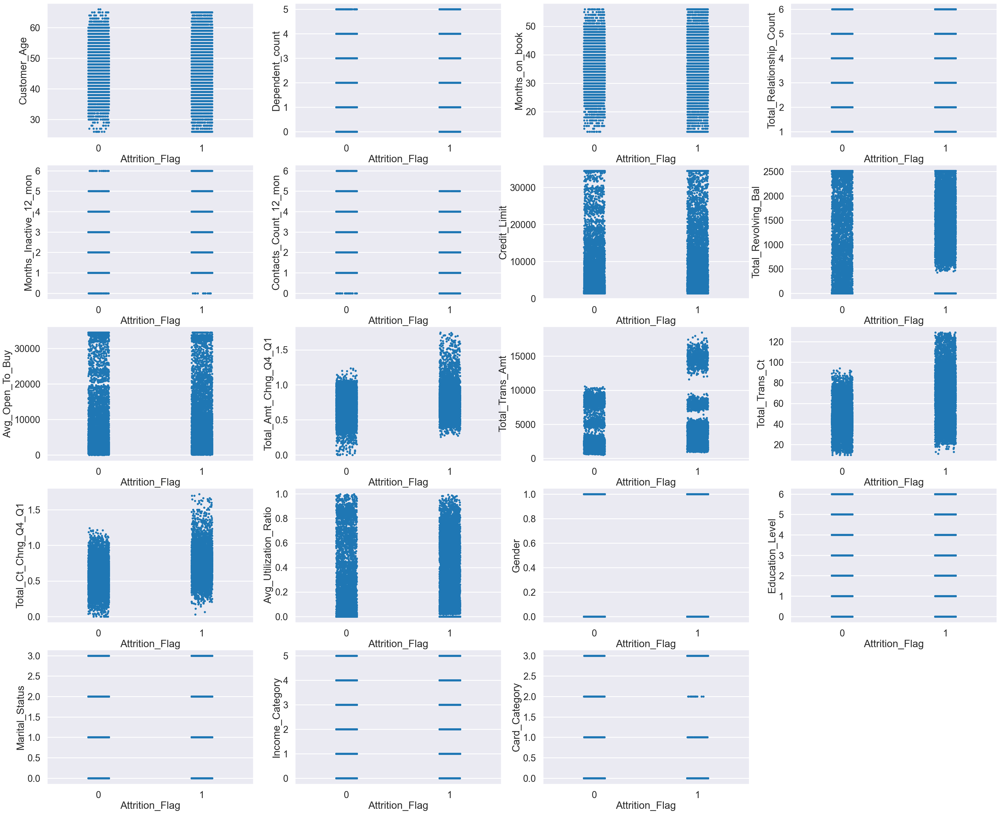

In [117]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

### **Feature Scaling (Numerical)**

In [118]:
min_max_scaler = MinMaxScaler()

for idx in df_upsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_upsampled[idx]=min_max_scaler.fit_transform(df_upsampled[idx].values.reshape(-1,1))

In [119]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000,16866.000000
mean,0.506497,0.444148,0.531383,0.490691,0.393632,0.421123,0.209758,0.377589,0.215082,0.415916,0.187021,0.393108,0.372556,0.229091,0.376616,0.490701,0.449603,0.550042,0.052769,0.498221
std,0.182927,0.242113,0.171229,0.301190,0.151723,0.171572,0.274355,0.351696,0.263163,0.113077,0.169592,0.187162,0.123260,0.277617,0.484552,0.285507,0.234869,0.287387,0.207373,0.500012
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375000,0.200000,0.441860,0.200000,0.333333,0.333333,0.028765,0.000000,0.041587,0.345340,0.084567,0.252101,0.288376,0.000000,0.000000,0.333333,0.333333,0.400000,0.000000,0.000000
50%,0.500000,0.400000,0.534884,0.400000,0.333333,0.500000,0.087236,0.367501,0.099639,0.411664,0.119701,0.344538,0.369528,0.094094,0.000000,0.500000,0.333333,0.600000,0.000000,0.000000
75%,0.625000,0.600000,0.627907,0.800000,0.500000,0.500000,0.269443,0.669050,0.275602,0.483544,0.226383,0.529412,0.448606,0.417417,1.000000,0.666667,0.666667,0.800000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [120]:
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16866 entries, 0 to 16999
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              16866 non-null  float64
 1   Dependent_count           16866 non-null  float64
 2   Months_on_book            16866 non-null  float64
 3   Total_Relationship_Count  16866 non-null  float64
 4   Months_Inactive_12_mon    16866 non-null  float64
 5   Contacts_Count_12_mon     16866 non-null  float64
 6   Credit_Limit              16866 non-null  float64
 7   Total_Revolving_Bal       16866 non-null  float64
 8   Avg_Open_To_Buy           16866 non-null  float64
 9   Total_Amt_Chng_Q4_Q1      16866 non-null  float64
 10  Total_Trans_Amt           16866 non-null  float64
 11  Total_Trans_Ct            16866 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       16866 non-null  float64
 13  Avg_Utilization_Ratio     16866 non-null  float64
 14  Gender

<AxesSubplot:>

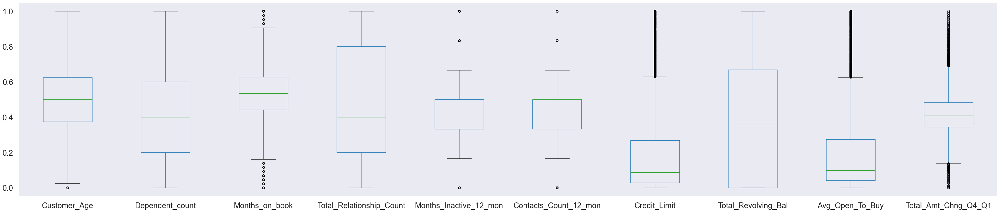

In [121]:
df_upsampled.boxplot(column=[str(i) for count, i in enumerate(df_upsampled.columns) if i != 'Attrition_Flag' and count < 10], figsize=(50,10), grid=False)

<AxesSubplot:>

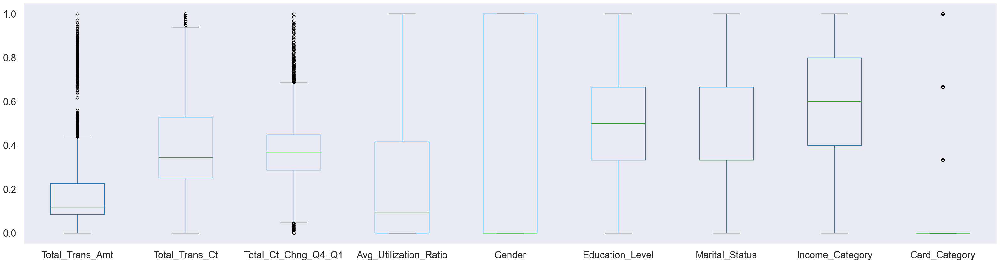

In [122]:
df_upsampled.boxplot(column=[str(i) for count, i in enumerate(df_upsampled.columns) if i != 'Attrition_Flag' and count < 20 and count >= 10], figsize=(40,10), grid=False)

### **Feature Selection**

In [123]:
selector = SelectKBest(f_classif, k=9)
x_up = df_upsampled.drop(['Attrition_Flag'], axis = 1)
y_up = df_upsampled['Attrition_Flag']

df_up_anova = selector.fit(x_up, y_up)

col = selector.get_support(indices=True)
df_up_anova = x_up.iloc[:,col]

#### **Concatenate Data**

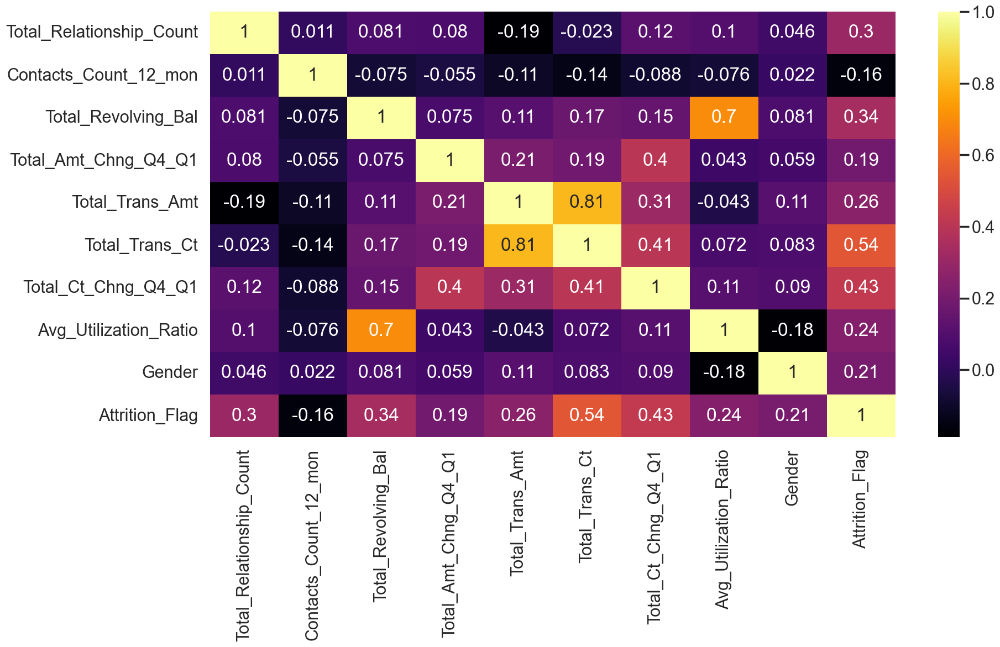

In [124]:
df_up_anova = pd.concat([df_up_anova, y_up], axis=1)
checkCorrFF(df_up_anova)

In [125]:
df_up_anova.columns

Index(['Total_Relationship_Count', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Attrition_Flag'],
      dtype='object')

In [126]:
df_up_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

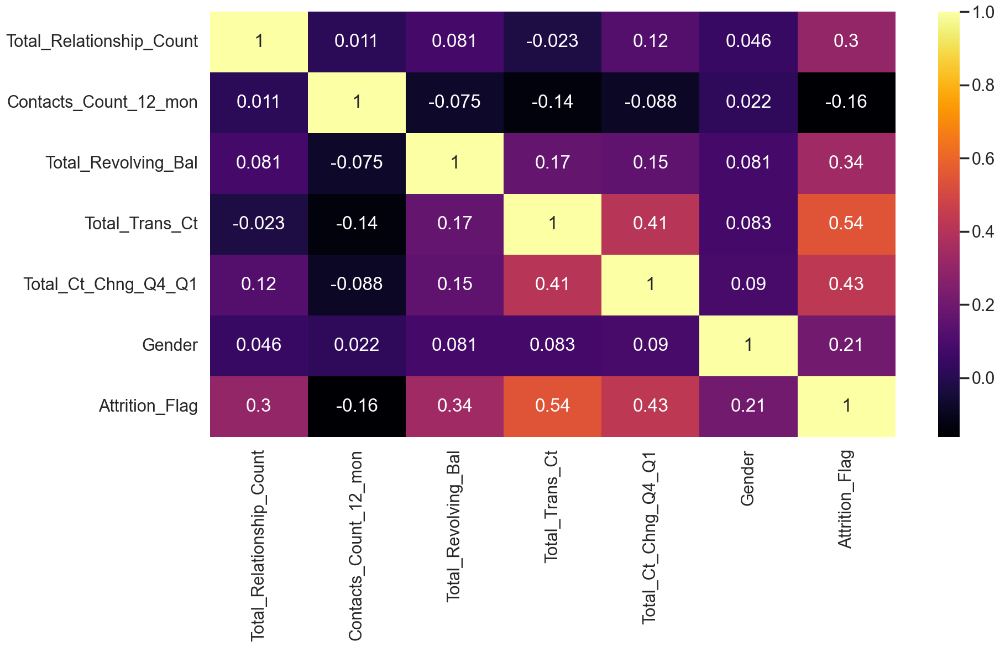

In [127]:
checkCorrFF(df_up_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8406 se=0.003
>f1 score 2 mean=0.8403 se=0.003
>f1 score 3 mean=0.8405 se=0.002
>f1 score 4 mean=0.8406 se=0.002
>f1 score 5 mean=0.8406 se=0.001


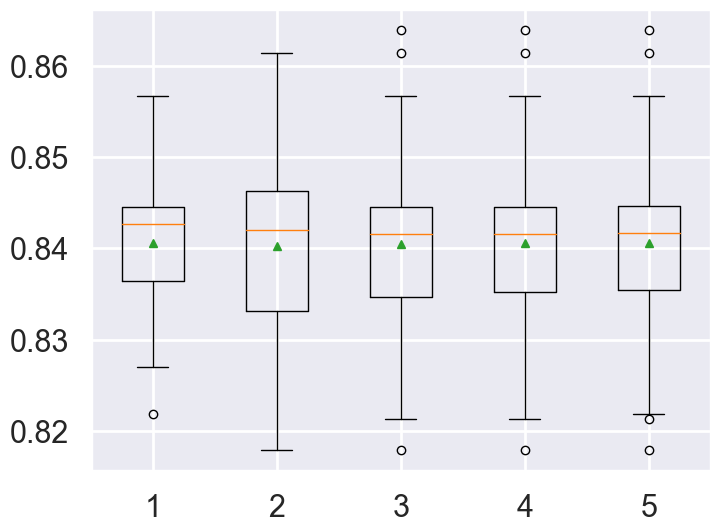

In [128]:
# create dataset
X_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_up_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_up_anova = evaluate_model(X_up_anova, y_up_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_up_anova), sem(scores_up_anova)))
	# store
	results_up_anova.append(scores_up_anova)
# plot the results
plt.boxplot(results_up_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [129]:
#get the dummy variables for the categorical variables
x_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

x_up_anova_train,x_up_anova_test,y_up_anova_train,y_up_anova_test = train_test_split(x_up_anova, y_up_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_up_anova=LogisticRegression()
logreg_cv_up_anova=GridSearchCV(logreg_up_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1')
logreg_cv_up_anova.fit(x_up_anova_train,y_up_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_up_anova.best_params_)
print("f1 :",logreg_cv_up_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2', 'solver': 'saga'}
f1 : 0.8425493813304549


In [130]:
clf_up_anova = LogisticRegression(C=logreg_cv_up_anova.best_params_['C'], penalty=logreg_cv_up_anova.best_params_['penalty'], solver=logreg_cv_up_anova.best_params_['solver'])

clf_up_anova.fit(x_up_anova_train,y_up_anova_train)
print("model score: %.8f" % clf_up_anova.score(x_up_anova_test, y_up_anova_test))

model score: 0.84113811


### **Classification report**

In [131]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_train, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_train, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.85      0.84      0.84      6760
           1       0.84      0.85      0.84      6732

    accuracy                           0.84     13492
   macro avg       0.84      0.84      0.84     13492
weighted avg       0.84      0.84      0.84     13492

Confusion matrix 
[[5651 1109]
 [1029 5703]]


In [133]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_test, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_test, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      1703
           1       0.83      0.85      0.84      1671

    accuracy                           0.84      3374
   macro avg       0.84      0.84      0.84      3374
weighted avg       0.84      0.84      0.84      3374

Confusion matrix 
[[1419  284]
 [ 252 1419]]


# **Resampling Method 2** : Downsampling
<hr>

## **Data Preprocessing**
### **Resampling**

In [73]:
Att0_messages = df_LE[df_LE["Attrition_Flag"] == 0]
Att1_messages  = df_LE[df_LE["Attrition_Flag"] == 1]
print(Att0_messages.shape)
print(Att1_messages.shape)

(1627, 20)
(8500, 20)


In [74]:
Att_dwsample = resample(Att1_messages,
             replace=True,
             n_samples=len(Att0_messages),
             random_state=42)

print(Att_dwsample.shape)

(1627, 20)


1    1627
0    1627
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

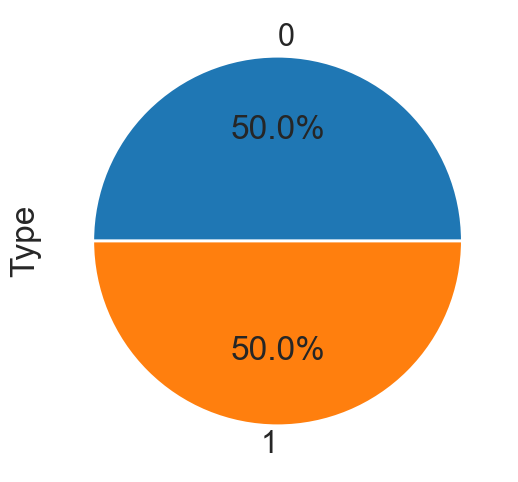

In [75]:
df_dwsampled = pd.concat([Att_dwsample, Att0_messages])

print(df_dwsampled["Attrition_Flag"].value_counts())

df_dwsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [76]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000
mean,46.347265,2.359250,35.773817,3.573448,2.485864,2.660725,8290.062569,963.211125,7326.851444,0.730707,3861.670252,56.793178,0.649647,0.231552,0.449908,3.078365,1.488937,2.882299,0.171789,0.500000
std,7.938040,1.293536,7.957958,1.591356,0.997206,1.127779,8934.789490,893.995153,8941.778905,0.219960,3042.775349,22.185991,0.252565,0.276535,0.497561,1.837297,0.736619,1.504570,0.678367,0.500077
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,2.000000,2.000000,2.000000,2422.000000,0.000000,1438.300000,0.597250,2022.000000,40.000000,0.486000,0.000000,0.000000,2.000000,1.000000,2.000000,0.000000,0.000000
50%,46.000000,2.000000,36.000000,3.000000,3.000000,3.000000,4386.000000,908.000000,3471.500000,0.718000,2692.500000,53.000000,0.647000,0.102000,0.000000,3.000000,1.000000,3.000000,0.000000,0.500000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10195.000000,1701.750000,9380.250000,0.853000,4585.250000,73.000000,0.779750,0.420000,1.000000,5.000000,2.000000,4.000000,0.000000,1.000000
max,68.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,2.275000,17390.000000,131.000000,3.714000,0.999000,1.000000,6.000000,3.000000,5.000000,3.000000,1.000000


In [77]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Feature Scaling (Numerical)**

In [78]:
min_max_scaler = MinMaxScaler()

for idx in df_dwsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_dwsampled[idx]=min_max_scaler.fit_transform(df_dwsampled[idx].values.reshape(-1,1))

In [79]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000,3254.000000
mean,0.484459,0.471850,0.529624,0.514690,0.414311,0.443454,0.207141,0.382682,0.212206,0.321190,0.198559,0.386720,0.174918,0.231783,0.449908,0.513061,0.496312,0.576460,0.057263,0.500000
std,0.189001,0.258707,0.185069,0.318271,0.166201,0.187963,0.270115,0.355183,0.259084,0.096686,0.180259,0.183355,0.068003,0.276812,0.497561,0.306216,0.245540,0.300914,0.226122,0.500077
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.357143,0.200000,0.418605,0.200000,0.333333,0.333333,0.029739,0.000000,0.041587,0.262527,0.089573,0.247934,0.130856,0.000000,0.000000,0.333333,0.333333,0.400000,0.000000,0.000000
50%,0.476190,0.400000,0.534884,0.400000,0.500000,0.500000,0.089114,0.360747,0.100498,0.315604,0.129295,0.355372,0.174206,0.102102,0.000000,0.500000,0.333333,0.600000,0.000000,0.500000
75%,0.619048,0.600000,0.627907,0.800000,0.500000,0.500000,0.264731,0.676103,0.271702,0.374945,0.241425,0.520661,0.209949,0.420420,1.000000,0.833333,0.666667,0.800000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [80]:
df_dwsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3254 entries, 8572 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              3254 non-null   float64
 1   Dependent_count           3254 non-null   float64
 2   Months_on_book            3254 non-null   float64
 3   Total_Relationship_Count  3254 non-null   float64
 4   Months_Inactive_12_mon    3254 non-null   float64
 5   Contacts_Count_12_mon     3254 non-null   float64
 6   Credit_Limit              3254 non-null   float64
 7   Total_Revolving_Bal       3254 non-null   float64
 8   Avg_Open_To_Buy           3254 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      3254 non-null   float64
 10  Total_Trans_Amt           3254 non-null   float64
 11  Total_Trans_Ct            3254 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       3254 non-null   float64
 13  Avg_Utilization_Ratio     3254 non-null   float64
 14  Gend

### **Clear outlier**

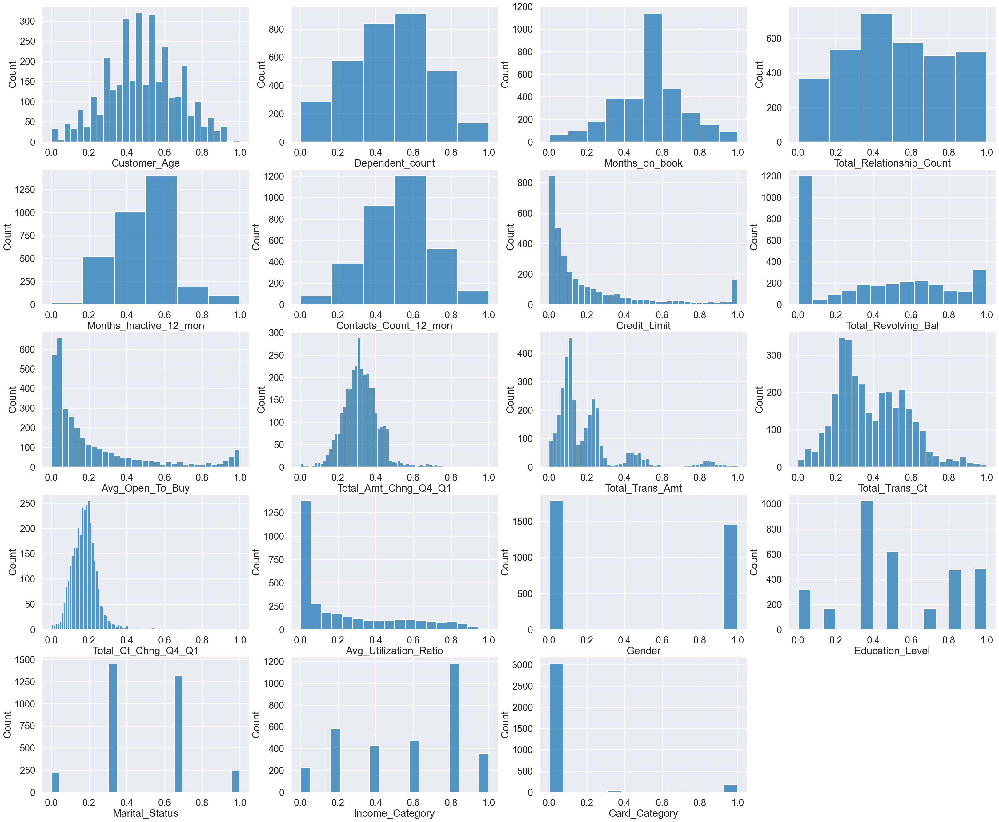

In [81]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_dwsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_dwsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_dwsampled[col],bins=10)
        else:
            sns.histplot(df_dwsampled[col])

**Strip Plot**

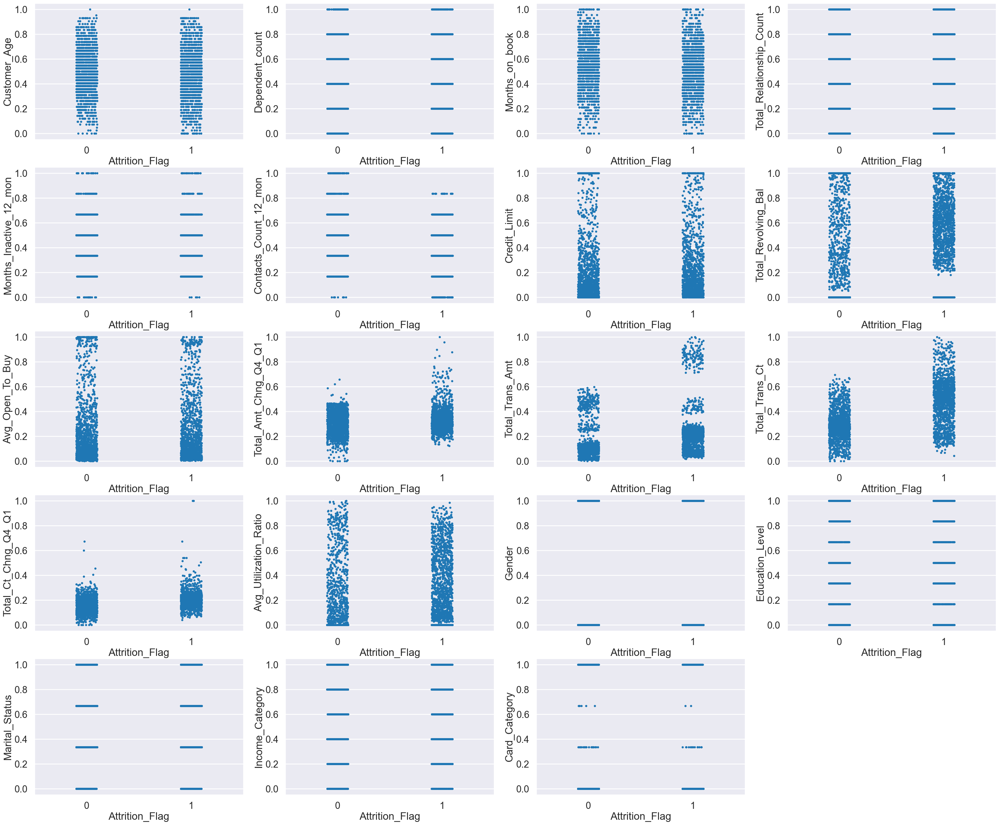

In [84]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

**Remove Outliers**

In [85]:
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Ct_Chng_Q4_Q1'] >= 0.37].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 0].index)
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Ct_Chng_Q4_Q1'] >= 0.6].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 1].index)
print(df_dwsampled.shape)

df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Amt_Chng_Q4_Q1'] >= 0.425].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 0].index)
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Total_Amt_Chng_Q4_Q1'] >= 0.8].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 1].index)
print(df_dwsampled.shape)

df_dwsampled = IQRdrop(df_dwsampled, 'Customer_Age')

(3246, 20)
(3047, 20)


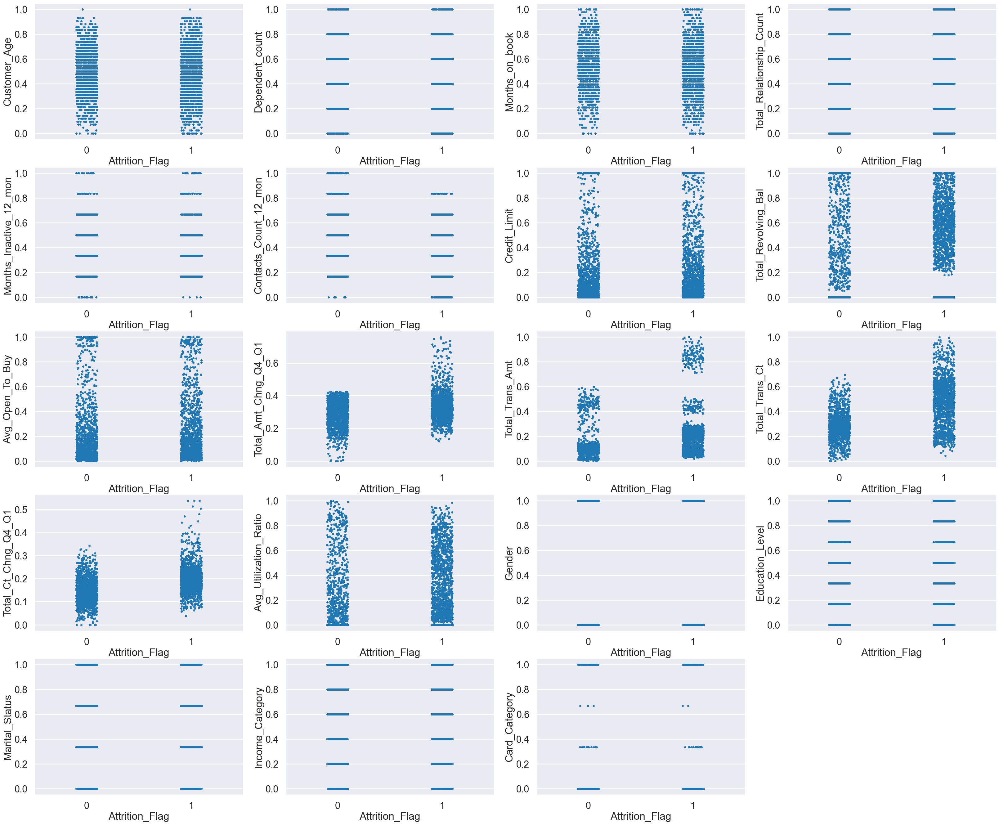

In [86]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

### **Feature Selection**

In [87]:
selector_dw_anova = SelectKBest(f_classif, k=9)
x_dw = df_dwsampled.drop(['Attrition_Flag'], axis = 1)
y_dw = df_dwsampled['Attrition_Flag']

df_dw_anova = selector_dw_anova.fit(x_dw, y_dw)

col_dw_anova = selector_dw_anova.get_support(indices=True)
df_dw_anova = x_dw.iloc[:,col_dw_anova]

#### **Concatenate Data**

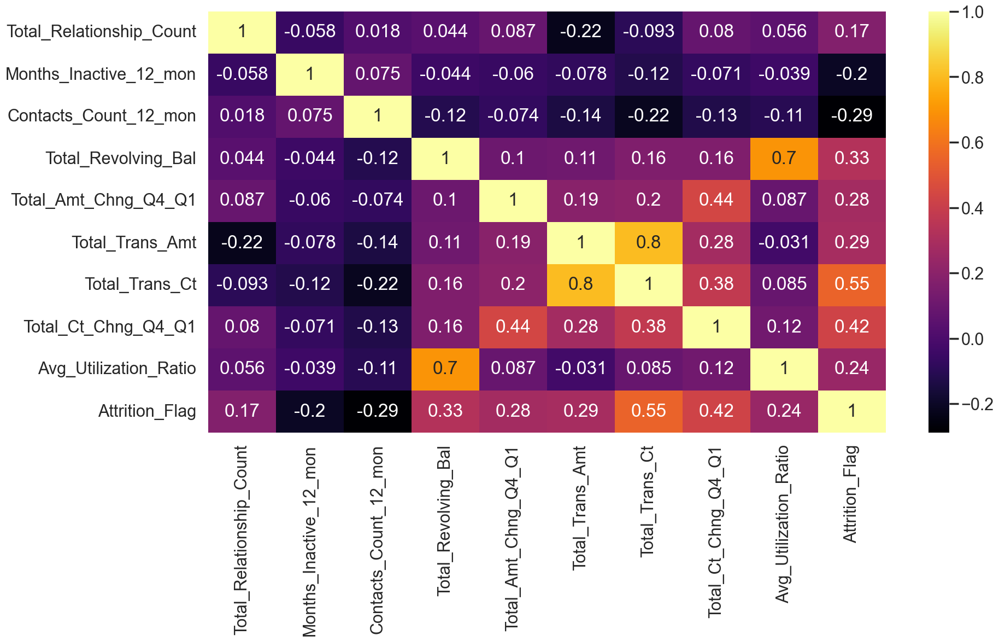

In [88]:
df_dw_anova = pd.concat([df_dw_anova, y_dw], axis=1)
checkCorrFF(df_dw_anova)

In [89]:
df_dw_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Attrition_Flag'],
      dtype='object')

In [90]:
df_dw_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

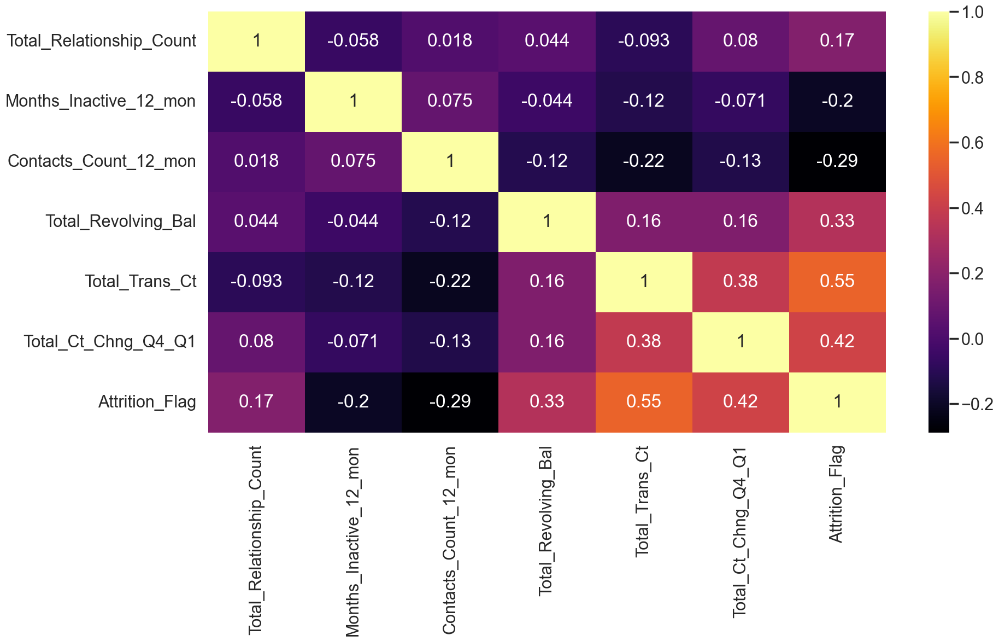

In [91]:
checkCorrFF(df_dw_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8409 se=0.006
>f1 score 2 mean=0.8395 se=0.004
>f1 score 3 mean=0.8393 se=0.004
>f1 score 4 mean=0.8388 se=0.003
>f1 score 5 mean=0.8387 se=0.003


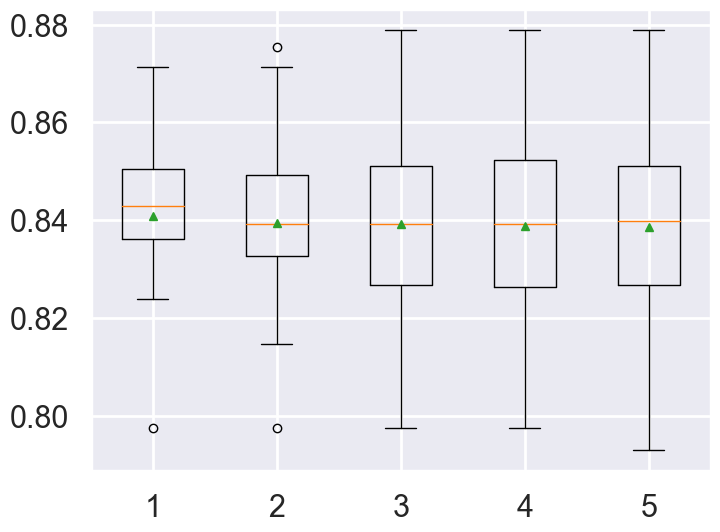

In [92]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

# create dataset
X_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_dw_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_dw_anova = evaluate_model(X_dw_anova, y_dw_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_dw_anova), sem(scores_dw_anova)))
	# store
	results_dw_anova.append(scores_dw_anova)
# plot the results
plt.boxplot(results_dw_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [93]:
from sklearn.model_selection import GridSearchCV

#get the dummy variables for the categorical variables
x_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

x_dw_anova_train,x_dw_anova_test,y_dw_anova_train,y_dw_anova_test = train_test_split(x_dw_anova, y_dw_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_dw_anova=LogisticRegression()
logreg_cv_dw_anova=GridSearchCV(logreg_dw_anova
                              ,grid
                              ,cv=10
                              ,scoring='f1')
logreg_cv_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_dw_anova.best_params_)
print("f1 :",logreg_cv_dw_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'solver': 'saga'}
f1 : 0.8394081431148205


In [154]:
clf_dw_anova = LogisticRegression(C=logreg_cv_dw_anova.best_params_['C']
                                  , penalty=logreg_cv_dw_anova.best_params_['penalty']
                                  , solver=logreg_cv_dw_anova.best_params_['solver'])

clf_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)
print("model score: %.8f" % clf_dw_anova.score(x_dw_anova_test, y_dw_anova_test))

model score: 0.84754098


### **Classification report**

In [155]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      1150
           1       0.84      0.84      0.84      1287

    accuracy                           0.83      2437
   macro avg       0.83      0.83      0.83      2437
weighted avg       0.83      0.83      0.83      2437

Confusion matrix 
[[ 940  210]
 [ 205 1082]]


In [96]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       278
           1       0.86      0.86      0.86       332

    accuracy                           0.85       610
   macro avg       0.85      0.85      0.85       610
weighted avg       0.85      0.85      0.85       610

Confusion matrix 
[[230  48]
 [ 45 287]]


# **Resampling Method 3** : Tomek Links
<hr>

## **Data Preprocessing**

### **Resampling**

<AxesSubplot:ylabel='Type'>

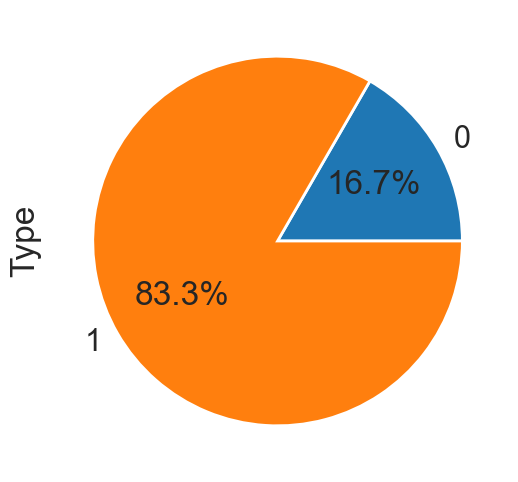

In [157]:
undersample = TomekLinks()

# transform the dataset
dfX = df_LE.drop(['Attrition_Flag'], axis=1)
dfY = df_LE['Attrition_Flag']
X, y = undersample.fit_resample(dfX, dfY)
dfTomek = pd.concat([X, y], axis=1)

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                        y = "Attrition_Flag",
                                        label = "Type",
                                        autopct='%1.1f%%')

1    8137
0    1627
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

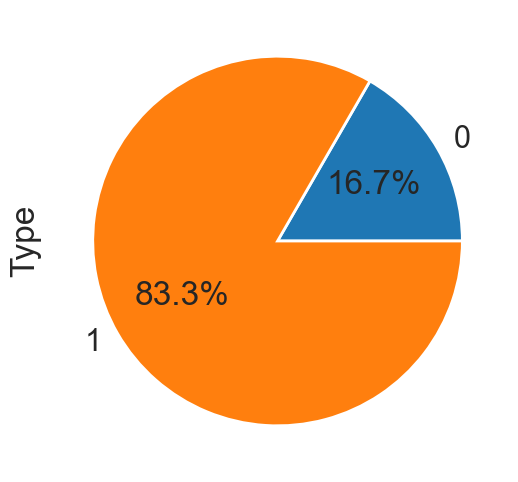

In [158]:
print(dfTomek["Attrition_Flag"].value_counts())

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [159]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000
mean,46.424007,2.353134,36.003175,3.797317,2.346784,2.452171,8583.718189,1170.318107,7413.400082,0.757678,4457.891336,65.250102,0.710847,0.277192,0.466510,3.097091,1.465178,2.868906,0.178615,0.833367
std,7.943843,1.297986,7.926509,1.555616,1.009318,1.108230,9058.336926,808.370417,9053.564770,0.215740,3426.571962,23.493231,0.233480,0.275357,0.498903,1.834267,0.738541,1.505230,0.691063,0.372667
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2542.000000,499.750000,1297.750000,0.631000,2196.000000,45.000000,0.583000,0.028000,0.000000,2.000000,1.000000,2.000000,0.000000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4491.500000,1288.000000,3423.000000,0.736000,3943.000000,68.000000,0.702000,0.179500,0.000000,3.000000,1.000000,3.000000,0.000000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10960.250000,1783.000000,9775.500000,0.857000,4754.000000,81.000000,0.818000,0.506250,1.000000,5.000000,2.000000,4.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.571000,0.999000,1.000000,6.000000,3.000000,5.000000,3.000000,1.000000


In [160]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Feature Scaling (Numerical)**

In [161]:
min_max_scaler = MinMaxScaler()

for idx in dfTomek.columns:
    if idx not in ['Attrition_Flag']:
        dfTomek[idx]=min_max_scaler.fit_transform(dfTomek[idx].values.reshape(-1,1))

In [162]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
count,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000,9764.000000
mean,0.434553,0.470627,0.534958,0.559463,0.391131,0.408695,0.216019,0.464965,0.214713,0.223043,0.219645,0.428295,0.199061,0.277470,0.466510,0.516182,0.488393,0.573781,0.059538,0.833367
std,0.169018,0.259597,0.184337,0.311123,0.168220,0.184705,0.273850,0.321164,0.262323,0.063509,0.190640,0.182118,0.065382,0.275633,0.498903,0.305711,0.246180,0.301046,0.230354,0.372667
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.319149,0.200000,0.441860,0.400000,0.333333,0.333333,0.033367,0.198550,0.037515,0.185752,0.093802,0.271318,0.163260,0.028028,0.000000,0.333333,0.333333,0.400000,0.000000,1.000000
50%,0.425532,0.400000,0.534884,0.600000,0.333333,0.333333,0.092304,0.511720,0.099093,0.216662,0.190998,0.449612,0.196584,0.179680,0.000000,0.500000,0.333333,0.600000,0.000000,1.000000
75%,0.553191,0.600000,0.627907,0.800000,0.500000,0.500000,0.287866,0.708383,0.283154,0.252281,0.236119,0.550388,0.229067,0.506757,1.000000,0.833333,0.666667,0.800000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [164]:
dfTomek.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9764 entries, 0 to 9763
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              9764 non-null   float64
 1   Dependent_count           9764 non-null   float64
 2   Months_on_book            9764 non-null   float64
 3   Total_Relationship_Count  9764 non-null   float64
 4   Months_Inactive_12_mon    9764 non-null   float64
 5   Contacts_Count_12_mon     9764 non-null   float64
 6   Credit_Limit              9764 non-null   float64
 7   Total_Revolving_Bal       9764 non-null   float64
 8   Avg_Open_To_Buy           9764 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      9764 non-null   float64
 10  Total_Trans_Amt           9764 non-null   float64
 11  Total_Trans_Ct            9764 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       9764 non-null   float64
 13  Avg_Utilization_Ratio     9764 non-null   float64
 14  Gender  

### **Clear outlier**

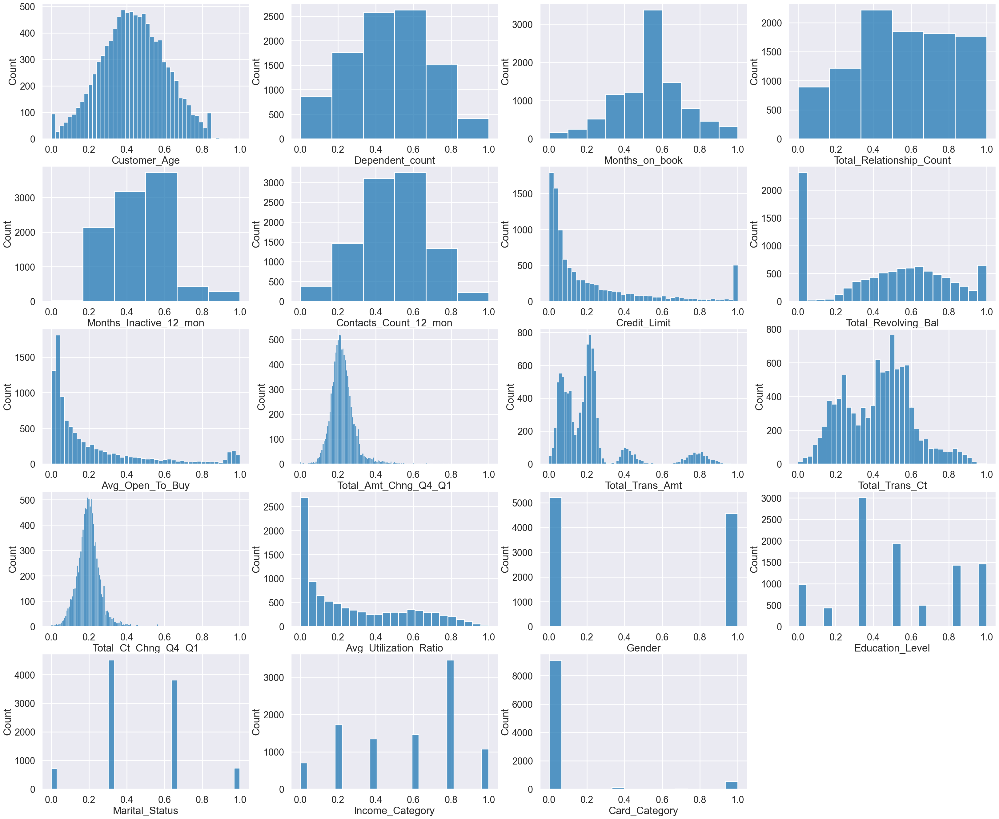

In [165]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfTomek.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfTomek[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfTomek[col],bins=10)
        else:
            sns.histplot(dfTomek[col])

**Strip Plot**

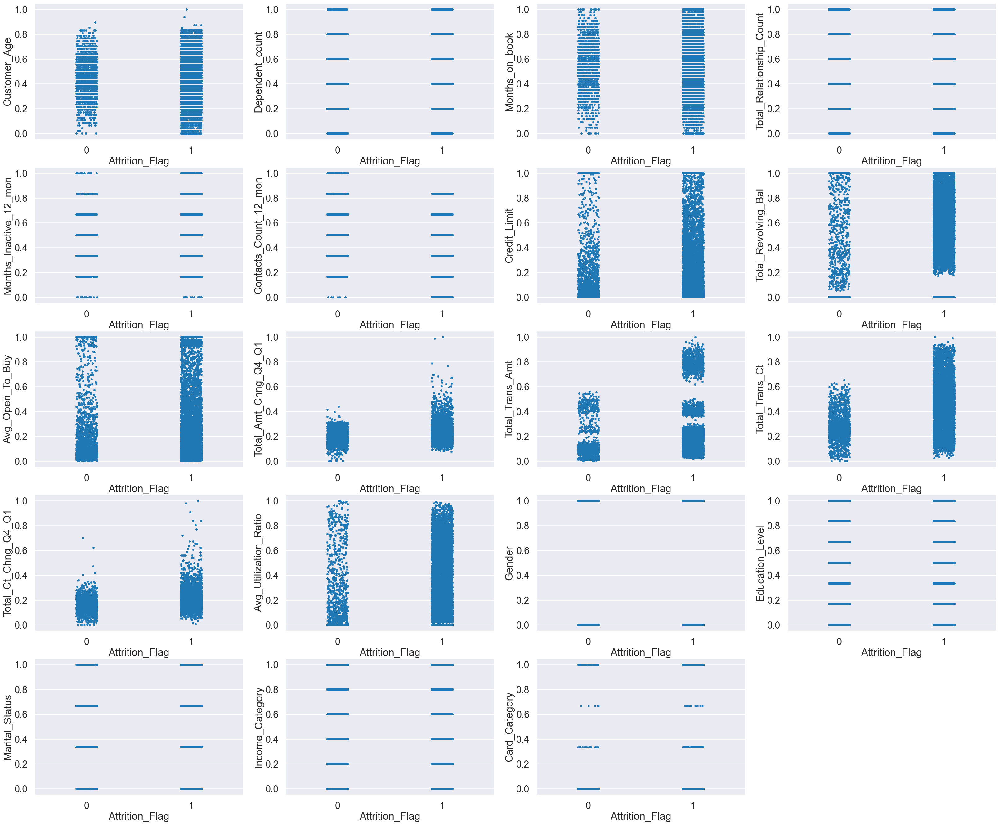

In [168]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

**Remove Outliers**

In [169]:
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.37].index & dfTomek[dfTomek['Attrition_Flag'] == 0].index)
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.7].index & dfTomek[dfTomek['Attrition_Flag'] == 1].index)
dfTomek = IQRdrop(dfTomek, 'Customer_Age')

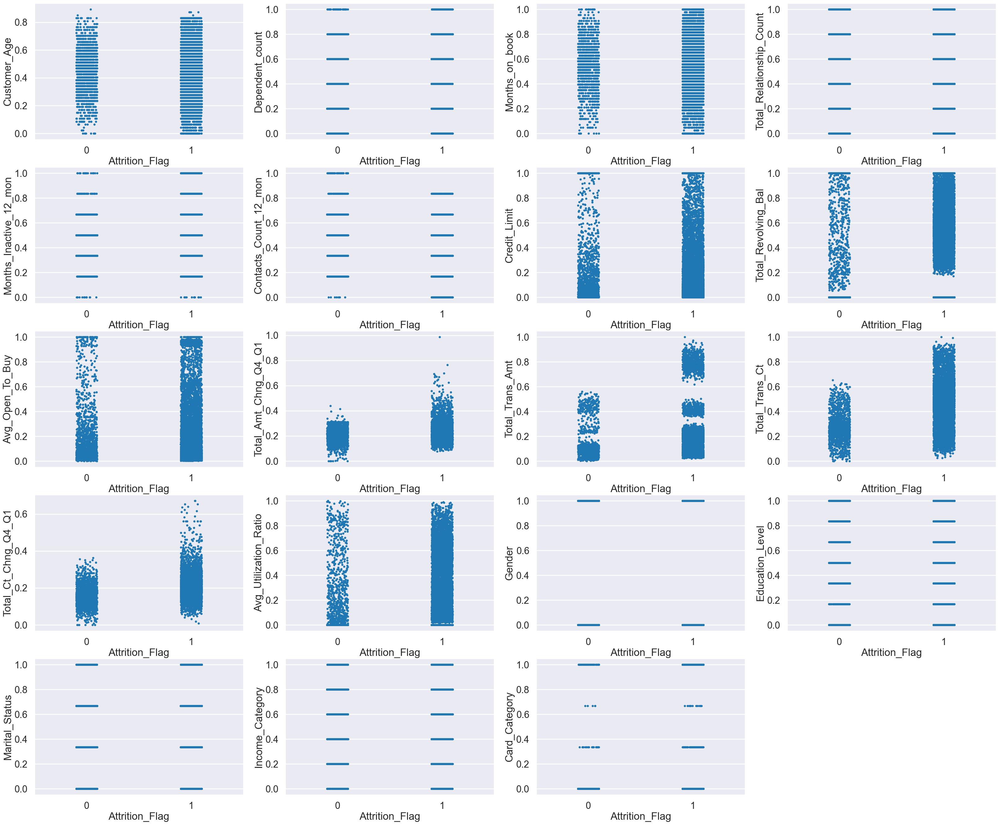

In [170]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

### **Feature Selection**

In [171]:
selector_tm = SelectKBest(f_classif, k=9)
x_tm = dfTomek.drop(['Attrition_Flag'], axis = 1)
y_tm = dfTomek['Attrition_Flag']

df_tm_anova = selector_tm.fit(x_tm, y_tm)

col_tm = selector_tm.get_support(indices=True)
df_tm_anova = x_tm.iloc[:,col_tm]

#### **Concatenate Data**

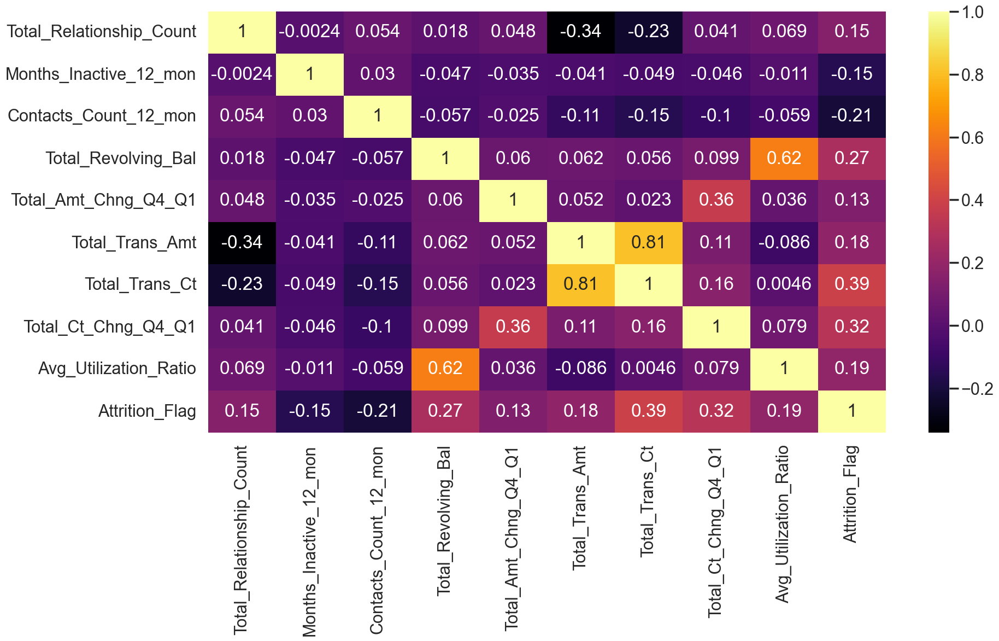

In [178]:
df_tm_anova = pd.concat([df_tm_anova, y_tm], axis=1)
checkCorrFF(df_tm_anova)

In [180]:
df_tm_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Attrition_Flag'],
      dtype='object')

In [181]:
df_tm_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

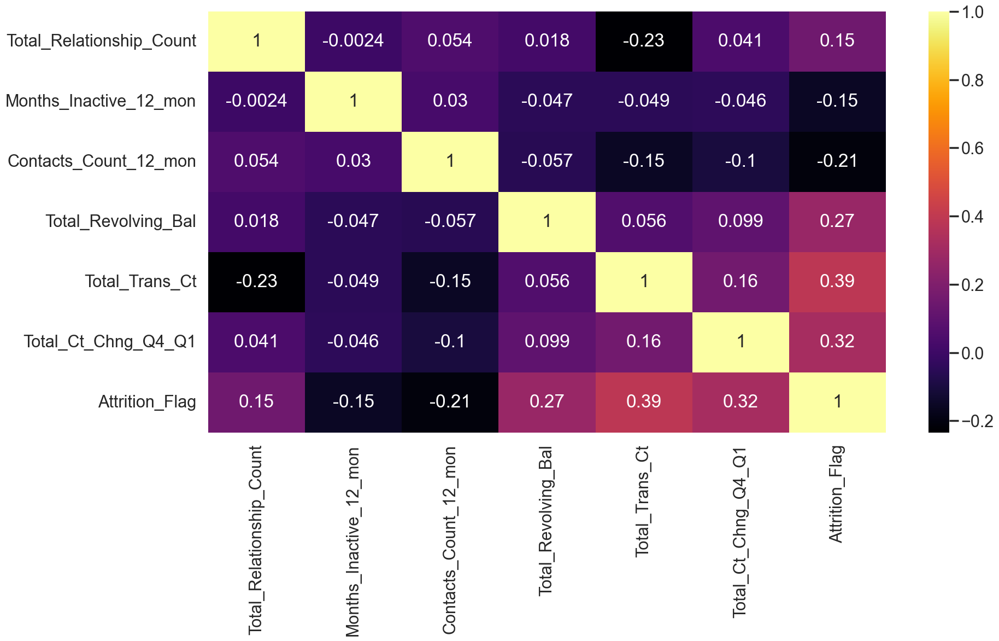

In [182]:
checkCorrFF(df_tm_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.9392 se=0.002
>f1 score 2 mean=0.9392 se=0.001
>f1 score 3 mean=0.9391 se=0.001
>f1 score 4 mean=0.9390 se=0.001
>f1 score 5 mean=0.9390 se=0.001


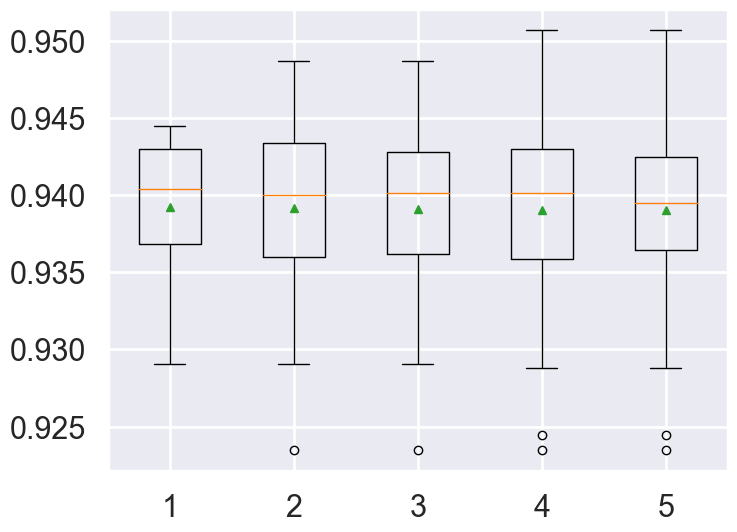

In [183]:
# create dataset
X_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_tm_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_tm_anova = evaluate_model(X_tm_anova, y_tm_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_tm_anova), sem(scores_tm_anova)))
	# store
	results_tm_anova.append(scores_tm_anova)
# plot the results
plt.boxplot(results_tm_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [184]:
#get the dummy variables for the categorical variables
x_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

x_tm_anova_train,x_tm_anova_test,y_tm_anova_train,y_tm_anova_test = train_test_split(x_tm_anova, y_tm_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_tm_anova=LogisticRegression()
logreg_cv_tm_anova=GridSearchCV(logreg_tm_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1')
logreg_cv_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_tm_anova.best_params_)
print("f1 :",logreg_cv_tm_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.1, 'penalty': 'l1', 'solver': 'saga'}
f1 : 0.9400786582187924


In [185]:
clf_tm_anova = LogisticRegression(C=logreg_cv_tm_anova.best_params_['C']
                                  , penalty=logreg_cv_tm_anova.best_params_['penalty']
                                  , solver=logreg_cv_tm_anova.best_params_['solver'])

clf_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)
print("model score: %.8f" % clf_tm_anova.score(x_tm_anova_test, y_tm_anova_test))

model score: 0.89025641


### **Classification report**

In [187]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.79      0.50      0.61      1277
           1       0.91      0.97      0.94      6522

    accuracy                           0.90      7799
   macro avg       0.85      0.73      0.77      7799
weighted avg       0.89      0.90      0.89      7799

Confusion matrix 
[[ 633  644]
 [ 168 6354]]


In [188]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.80      0.50      0.62       345
           1       0.90      0.97      0.94      1605

    accuracy                           0.89      1950
   macro avg       0.85      0.74      0.78      1950
weighted avg       0.88      0.89      0.88      1950

Confusion matrix 
[[ 173  172]
 [  42 1563]]
